WebIO._IJuliaInit()

ЧАСТЬ 1: Квадратичные функции f(x) = alpa x₁² + beta x₂²

--- f = 1x₁² + 1x₂², x_0 = [100.0, 100.0] ---


┌ Warning: markershape star5 is unsupported with Plots.PlotlyJSBackend(). Choose from: [:auto, :circle, :cross, :diamond, :dtriangle, :hexagon, :hline, :none, :octagon, :pentagon, :rect, :utriangle, :vline, :x, :xcross]
└ @ Plots C:\Users\Admin\.julia\packages\Plots\xKhUG\src\args.jl:1581


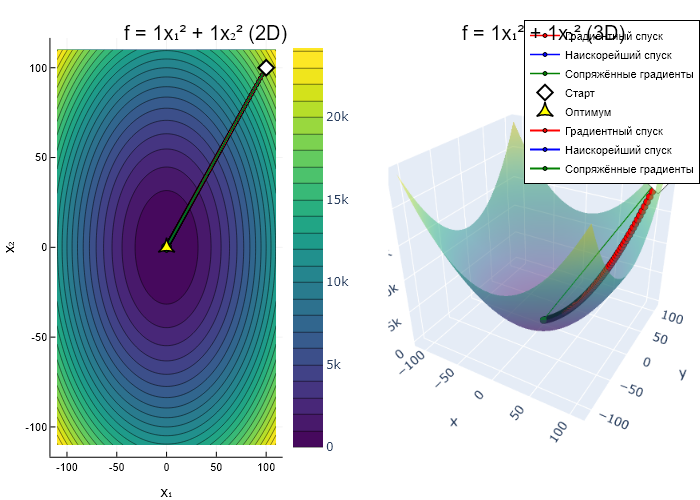

Сохранено: let3/quadratic_1_1.html

  Проверка ортогональности (∇f_k, ∇f_{k+1}):
    Градиентный спуск:
      шаг 0→1: 7.84e+04
      шаг 1→2: 7.53e+04
      шаг 2→3: 7.23e+04
      шаг 3→4: 6.95e+04
      шаг 4→5: 6.67e+04
    Наискорейший спуск:
      шаг 0→1: -5.65e-09
    Сопряжённые градиенты:
      шаг 0→1: -5.65e-09

--- f = 1x₁² + 10x₂², x_0 = [100.0, 100.0] ---


┌ Warning: markershape star5 is unsupported with Plots.PlotlyJSBackend(). Choose from: [:auto, :circle, :cross, :diamond, :dtriangle, :hexagon, :hline, :none, :octagon, :pentagon, :rect, :utriangle, :vline, :x, :xcross]
└ @ Plots C:\Users\Admin\.julia\packages\Plots\xKhUG\src\args.jl:1581


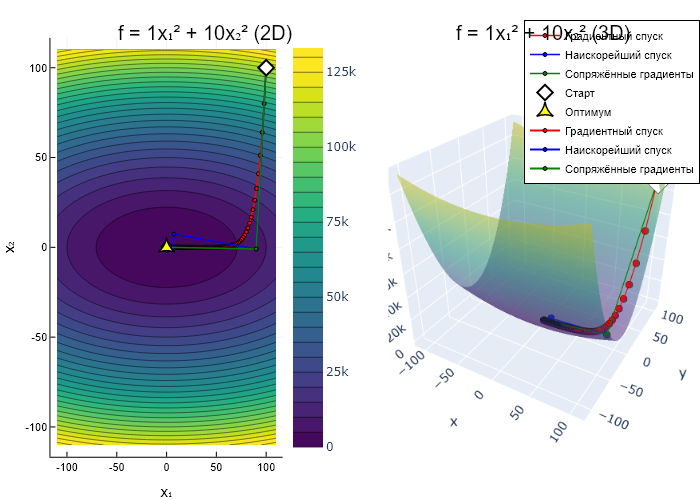

Сохранено: let3/quadratic_1_10.html

  Проверка ортогональности (∇f_k, ∇f_{k+1}):
    Градиентный спуск:
      шаг 0→1: 3.24e+06
      шаг 1→2: 2.09e+06
      шаг 2→3: 1.35e+06
      шаг 3→4: 8.74e+05
      шаг 4→5: 5.70e+05
    Наискорейший спуск:
      шаг 0→1: -1.44e-02
      шаг 1→2: 7.97e-05
      шаг 2→3: 6.30e-05
      шаг 3→4: -9.63e-07
      шаг 4→5: -2.50e-07
    Сопряжённые градиенты:
      шаг 0→1: -1.44e-02
      шаг 1→2: -1.02e-03
      шаг 2→3: -1.66e-18

--- f = 1x₁² + 20x₂², x_0 = [100.0, 100.0] ---


┌ Warning: markershape star5 is unsupported with Plots.PlotlyJSBackend(). Choose from: [:auto, :circle, :cross, :diamond, :dtriangle, :hexagon, :hline, :none, :octagon, :pentagon, :rect, :utriangle, :vline, :x, :xcross]
└ @ Plots C:\Users\Admin\.julia\packages\Plots\xKhUG\src\args.jl:1581


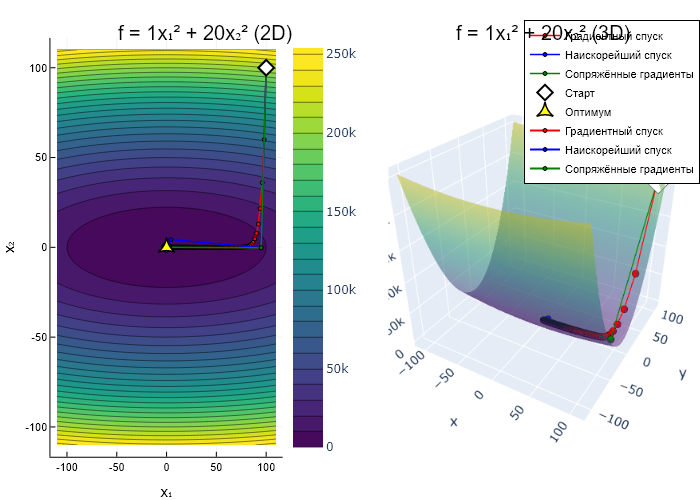

Сохранено: let3/quadratic_1_20.html

  Проверка ортогональности (∇f_k, ∇f_{k+1}):
    Градиентный спуск:
      шаг 0→1: 9.64e+06
      шаг 1→2: 3.49e+06
      шаг 2→3: 1.28e+06
      шаг 3→4: 4.83e+05
      шаг 4→5: 1.95e+05
    Наискорейший спуск:
      шаг 0→1: -3.55e-03
      шаг 1→2: -6.78e-05
      шаг 2→3: 2.78e-05
      шаг 3→4: -8.67e-08
      шаг 4→5: 7.66e-08
    Сопряжённые градиенты:
      шаг 0→1: -3.55e-03
      шаг 1→2: -1.51e-04
      шаг 2→3: -1.42e-20

ЧАСТЬ 2: Тестовые функции (Розенброк, Растригин, Швефель)

--- Розенброк ---


┌ Warning: markershape star5 is unsupported with Plots.PlotlyJSBackend(). Choose from: [:auto, :circle, :cross, :diamond, :dtriangle, :hexagon, :hline, :none, :octagon, :pentagon, :rect, :utriangle, :vline, :x, :xcross]
└ @ Plots C:\Users\Admin\.julia\packages\Plots\xKhUG\src\args.jl:1581


In [ ]:
using Plots
plotlyjs()
using LinearAlgebra
using Printf


"""
Метод золотого сечения для минимизации phi(alpa) на [a, b].
"""
function golden_section(phi, a, b; tol=1e-12, maxiter=200)
    tau = (√5 - 1) / 2  # ≈ 0.618
    x1 = b - tau * (b - a)
    x2 = a + tau * (b - a)
    f1 = phi(x1)
    f2 = phi(x2)
    for _ in 1:maxiter
        if (b - a) < tol
            break
        end
        if f1 < f2
            b = x2
            x2 = x1
            f2 = f1
            x1 = b - tau * (b - a)
            f1 = phi(x1)
        else
            a = x1
            x1 = x2
            f1 = f2
            x2 = a + tau * (b - a)
            f2 = phi(x2)
        end
    end
    return (a + b) / 2
end


"""
Метод градиентного спуска (Теорема 5.2, 5.3).

Алгоритм генерации последовательности {x^(k)}:
  x^(k+1) = x^(k) + alpa^(k) y^(k),  k = 0,1,2,...
  y^(k) = -grad_f(x^(k))
  alpa^(k) > 0 — величина шага спуска

По замечанию 1: если alpa = const может привести к нарушению
  f(x^(k+1)) < f(x^(k)),
то делаем откат: alpa := alpa/2 (backtracking).

Критерий остановки (замечание 2):
  |df(x^(k))/dx_i| ≤ ε₃, i = 1,...,n  или  ||grad_f(x^(k))|| ≤ ε₃
"""
function gradient_descent(f, grad_f, x0; alpa_0=1.0, ε=1e-6, maxiter=50000)
    x = copy(x0)
    trajectory = [copy(x)]
    n = length(x0)
    for k in 1:maxiter
        g = grad_f(x)
        # Критерий остановки: ||grad_f(x^(k))|| ≤ ε
        if norm(g) ≤ ε
            break
        end
        # y^(k) = -grad_f(x^(k))
        y = -g
        # Выбор шага с backtracking (замечание 1 из лекции):
        # alpa := alpa/2, пока f(x^(k+1)) ≥ f(x^(k))
        alpa = alpa_0
        fx = f(x)
        for _ in 1:50
            x_new = x + alpa * y
            if f(x_new) < fx
                break
            end
            alpa /= 2
        end
        x = x + alpa * y
        push!(trajectory, copy(x))
    end
    return x, f(x), length(trajectory) - 1, trajectory
end

"""
Метод наискорейшего спуска (Теорема 5.4).

Формулы генерации последовательности (по лекции):
  x^(k+1) = x^(k) + alpa^(k) y^(k),  k = 0,1,2,...
  y^(k) = -grad_f(x^(k))

alpa^(k) > 0 берём из задачи одномерной оптимизации:
  g^(k)(alpa) = f(x^(k) + alpa y^(k)) ≡ f(x^(k) - alpa grad_f(x^(k)))
  alpa^(k) = argmin_{alpa>0} g^(k)(alpa)

Применяем метод золотого сечения к g^(k)(alpa).

Свойство (Теорема 5.4): направление спуска на (k+1)-й итерации
ортогонально направлению спуска на k-й итерации:
  (y^(k+1), y^(k)) = 0
"""
function steepest_descent(f, grad_f, x0; ε=1e-6, maxiter=50000, alpa_max=10.0)
    x = copy(x0)
    trajectory = [copy(x)]
    for k in 1:maxiter
        g = grad_f(x)
        if norm(g) ≤ ε
            break
        end
        # y^(k) = -grad_f(x^(k))
        y = -g
        # Одномерная оптимизация: g^(k)(alpa) = f(x^(k) + alpa * y^(k))
        # alpa^(k) = argmin_{alpa>0} g^(k)(alpa)
        phi(alpa) = f(x + alpa * y)
        alpa_opt = golden_section(phi, 0.0, alpa_max)
        x = x + alpa_opt * y
        push!(trajectory, copy(x))
    end
    return x, f(x), length(trajectory) - 1, trajectory
end

"""
Метод сопряжённых градиентов (Флетчера-Ривза, по лекции).

Алгоритм (по лекции):
  x^(k+1) = x^(k) - alpa^(k) p^(k),  k = 0,1,2,...
  p^(0) = grad_f(x^(0))
  p^(k) = grad_f(x^(k)) + beta^(k) p^(k-1),  k = 1,2,...

а) alpa^(k) > 0 определяется при решении задачи:
   g^(k)(alpa^(k)) = min_{alpa>0} g^(k)(alpa),  g^(k)(alpa) = f(x^(k) - alpa p^(k))

б) beta^(k) = ||grad_f(x^(k))||² / ||grad_f(x^(k-1))||²,  k = 1,2,...

Замечание: для минимизации накопления погрешности каждые N итераций
полагают beta_{mN} = 0, m = 0,1,2,...  (обновление метода).
N — параметр метода сопряжённых градиентов.
"""
function conjugate_gradients(f, grad_f, x0; ε=1e-6, maxiter=50000, alpa_max=10.0, N_restart=0)
    n = length(x0)
    if N_restart == 0
        N_restart = n  # по умолчанию: обновление каждые n итераций
    end
    x = copy(x0)
    trajectory = [copy(x)]
    g_prev = grad_f(x)
    # p^(0) = grad_f(x^(0))
    p = copy(g_prev)
    for k in 1:maxiter
        g_cur = grad_f(x)
        if norm(g_cur) ≤ ε
            break
        end
        if k == 1
            # p^(0) = grad_f(x^(0)) — уже задано
        else
            # beta^(k) = ||grad_f(x^(k))||² / ||grad_f(x^(k-1))||²
            # Замечание: beta_{mN} = 0 (обновление каждые N шагов)
            if mod(k - 1, N_restart) == 0
                beta = 0.0
            else
                beta = dot(g_cur, g_cur) / dot(g_prev, g_prev)
            end
            # p^(k) = grad_f(x^(k)) + beta^(k) p^(k-1)
            p = g_cur + beta * p
        end
        g_prev = copy(g_cur)
        # alpa^(k) из одномерной оптимизации:
        # g^(k)(alpa) = f(x^(k) - alpa p^(k))
        phi(alpa) = f(x - alpa * p)
        alpa_opt = golden_section(phi, 0.0, alpa_max)
        # x^(k+1) = x^(k) - alpa^(k) p^(k)
        x = x - alpa_opt * p
        push!(trajectory, copy(x))
    end
    return x, f(x), length(trajectory) - 1, trajectory
end

# Квадратичная
make_quadratic(alpa, beta) = (
    x -> alpa * x[1]^2 + beta * x[2]^2,
    x -> [2alpa * x[1], 2beta * x[2]]
)

# Розенброк
rosenbrock(x) = (1 - x[1])^2 + 100 * (x[2] - x[1]^2)^2
grad_rosenbrock(x) = [
    -2 * (1 - x[1]) - 400 * x[1] * (x[2] - x[1]^2),
     200 * (x[2] - x[1]^2)
]

# Растригин
rastrigin(x) = 20 + x[1]^2 + x[2]^2 - 10*(cos(2π*x[1]) + cos(2π*x[2]))
grad_rastrigin(x) = [
    2*x[1] + 20π*sin(2π*x[1]),
    2*x[2] + 20π*sin(2π*x[2])
]

# Швефель
schwefel(x) = 418.9829 * 2 - x[1]*sin(√(abs(x[1]))) - x[2]*sin(√(abs(x[2])))
function grad_schwefel(x)
    g = zeros(2)
    for i in 1:2
        xi = x[i]
        a = abs(xi)
        if a < 1e-10
            g[i] = 0.0
        else
            sa = √a
            g[i] = -sin(sa) - xi * cos(sa) * sign(xi) / (2 * sa)
        end
    end
    return g
end

function make_grid(f; xlims=(-5, 5), ylims=(-5, 5), n=200)
    xs = range(xlims[1], xlims[2], length=n)
    ys = range(ylims[1], ylims[2], length=n)
    zs = [f([xi, yi]) for yi in ys, xi in xs]
    return xs, ys, zs
end

const METHOD_COLORS = [:red, :blue, :green]
const METHOD_NAMES = ["Градиентный спуск", "Наискорейший спуск", "Сопряжённые градиенты"]

function plot_comparison(f, trajectories, method_names, title_str; xlims=(-5,5), ylims=(-5,5), optimum=[0.0, 0.0], nlevels=30, savepath=nothing)
    xs, ys, zs = make_grid(f; xlims=xlims, ylims=ylims, n=150)
    p2d = contour(xs, ys, zs, levels=nlevels, fill=true, color=:viridis, xlabel="x₁", ylabel="x₂", title="$title_str (2D)",
                  colorbar=true, linewidth=0.3)
    for (i, traj) in enumerate(trajectories)
        tx = [p[1] for p in traj]
        ty = [p[2] for p in traj]
        c = METHOD_COLORS[i]
        plot!(p2d, tx, ty, color=c, linewidth=1.5, label=method_names[i], markersize=2, markershape=:circle, markercolor=c)
    end
    x0 = trajectories[1][1]
    scatter!(p2d, [x0[1]], [x0[2]], markershape=:diamond, markersize=6, markercolor=:white, markerstrokecolor=:black, markerstrokewidth=2, label="Старт")
    for (i, traj) in enumerate(trajectories)
        xf = traj[end]
        scatter!(p2d, [xf[1]], [xf[2]], markershape=:hexagon, markersize=5, markercolor=METHOD_COLORS[i],
                 markerstrokecolor=:black, markerstrokewidth=1, label="")
    end
    scatter!(p2d, [optimum[1]], [optimum[2]], markershape=:star5, markersize=6, markercolor=:yellow, markerstrokecolor=:black,
             markerstrokewidth=1.5, label="Оптимум")
    p3d = surface(xs, ys, zs, color=:viridis, alpha=0.7, xlabel="x₁", ylabel="x₂", zlabel="f", title="$title_str (3D)", colorbar=false)
    for (i, traj) in enumerate(trajectories)
        tx = [p[1] for p in traj]
        ty = [p[2] for p in traj]
        tz = [f(p) for p in traj]
        c = METHOD_COLORS[i]
        plot!(p3d, tx, ty, tz, color=c, linewidth=2, label=method_names[i], markersize=2, markershape=:circle, markercolor=c)
    end
    scatter!(p3d, [x0[1]], [x0[2]], [f(x0)], markershape=:diamond, markersize=5, markercolor=:white, markerstrokecolor=:black,
             markerstrokewidth=2, label="")
    p = plot(p2d, p3d, layout=(1, 2), size=(1400, 600))
    display(p)
    if savepath !== nothing
        savefig(p, savepath)
        println("Сохранено: $savepath")
    end
    return p
end

function check_orthogonality_let3(trajs, method_names, grad_f)
    println("\n  Проверка ортогональности (∇f_k, ∇f_{k+1}):")
    for (i, traj) in enumerate(trajs)
        length(traj) < 2 && continue
        println("    $(method_names[i]):")
        for j in 1:min(length(traj)-1, 5)
            g_k = grad_f(traj[j])
            g_k1 = grad_f(traj[j+1])
            @printf("      шаг %d→%d: %.2e\n", j-1, j, dot(g_k, g_k1))
        end
    end
end

mkpath("let3")

results = []

function run_all_methods(f, grad_f, x0, fname; ε=1e-6, alpa_0=0.5, alpa_max=10.0, maxiter=50000)
    x1, f1, n1, t1 = gradient_descent(f, grad_f, x0; alpa_0=alpa_0, ε=ε, maxiter=maxiter)
    x2, f2, n2, t2 = steepest_descent(f, grad_f, x0; ε=ε, maxiter=maxiter, alpa_max=alpa_max)
    x3, f3, n3, t3 = conjugate_gradients(f, grad_f, x0; ε=ε, maxiter=maxiter, alpa_max=alpa_max)
    push!(results, (fname, "Градиентный",     n1, f1, x1))
    push!(results, (fname, "Наискорейший",     n2, f2, x2))
    push!(results, (fname, "Сопр. градиенты",  n3, f3, x3))
    return [t1, t2, t3]
end

println("="^70)
println("ЧАСТЬ 1: Квадратичные функции f(x) = alpa x₁² + beta x₂²")
println("="^70)
x0_quad = [100.0, 100.0]
quad_params = [(1, 1), (1, 10), (1, 20)]

for (alpa, beta) in quad_params
    f, grad_f = make_quadratic(alpa, beta)
    fname = "f = $(alpa)x₁² + $(beta)x₂²"
    println("\n--- $fname, x_0 = $x0_quad ---")
    trajs = run_all_methods(f, grad_f, x0_quad, fname; alpa_0=0.01, alpa_max=50.0, ε=1e-6)
    lim = 110.0
    plot_comparison(f, trajs, METHOD_NAMES, fname; xlims=(-lim, lim), ylims=(-lim, lim),
                    optimum=[0.0, 0.0], savepath="let3/quadratic_$(alpa)_$(beta).html")
    check_orthogonality_let3(trajs, METHOD_NAMES, grad_f)
end

println("\n" * "="^70)
println("ЧАСТЬ 2: Тестовые функции (Розенброк, Растригин, Швефель)")
println("="^70)
println("\n--- Розенброк ---")
x0_rosen = [3.0, 3.0]
trajs_rosen = run_all_methods(rosenbrock, grad_rosenbrock, x0_rosen, "Розенброк"; ε=1e-6, alpa_0=0.001, alpa_max=1.0, maxiter=100000)
plot_comparison(rosenbrock, trajs_rosen, METHOD_NAMES, "Розенброк"; xlims=(-1, 4), ylims=(-1, 10), optimum=[1.0, 1.0], savepath="let3/rosenbrock.html")
println("\n--- Растригин ---")
x0_rast = [4.0, 4.0]
trajs_rast = run_all_methods(rastrigin, grad_rastrigin, x0_rast, "Растригин"; ε=1e-6, alpa_0=0.01, alpa_max=1.0)
plot_comparison(rastrigin, trajs_rast, METHOD_NAMES, "Растригин"; xlims=(-5, 5), ylims=(-5, 5), optimum=[0.0, 0.0], savepath="let3/rastrigin.html")
println("\n--- Швефель ---")
x0_schw = [400.0, 400.0]
trajs_schw = run_all_methods(schwefel, grad_schwefel, x0_schw, "Швефель"; ε=1e-4, alpa_0=1.0, alpa_max=100.0)
plot_comparison(schwefel, trajs_schw, METHOD_NAMES, "Швефель"; xlims=(0, 500), ylims=(0, 500), optimum=[420.9687, 420.9687], savepath="let3/schwefel.html")
println("\n" * "="^80)
println("ИТОГОВАЯ ТАБЛИЦА СРАВНЕНИЯ")
println("="^80)
@printf("%-25s  %-20s  %8s  %15s  %20s\n", "Функция", "Метод", "Итер.", "f*", "x*")
println("-"^80)
for r in results
    fname, method, iters, fval, xval = r
    xstr = @sprintf("[%.6f, %.6f]", xval[1], xval[2])
    @printf("%-25s  %-20s  %8d  %15.8f  %20s\n", fname, method, iters, fval, xstr)
end
println("="^80)
println("\nГотово! Графики сохранены в папке let3/")
println("Все графики интерактивные (PlotlyJS) — можно вращать 3D мышкой.")